In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
import torch
from diffusers import StableDiffusionPipeline

/data/healthy-ml/scratch/qixuanj/anaconda3/envs/control/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
import os
import glob
import skimage
import pandas as pd
import numpy as np
from diffusers.utils import load_image
from PIL import Image

In [5]:
torch.cuda.get_device_name(0)

'NVIDIA A100 80GB PCIe'

In [ ]:
# download ControlNet model 
# from huggingface_hub import hf_hub_download

In [ ]:
# the default soft edges model 

# local_dir = "/data/healthy-ml/scratch/qixuanj/generative_validation/ControlNet"
# hf_hub_download(repo_id="lllyasviel/ControlNet", filename="models/control_sd15_hed.pth",local_dir=local_dir)
# hf_hub_download(repo_id="lllyasviel/ControlNet", filename="models/control_sd15_seg.pth",local_dir=local_dir)

# hf_hub_download(repo_id="lllyasviel/ControlNet", filename="annotator/ckpts/dpt_hybrid-midas-501f0c75.pt",local_dir=local_dir)
# hf_hub_download(repo_id="lllyasviel/ControlNet", filename="annotator/ckpts/network-bsds500.pth",local_dir=local_dir)
# hf_hub_download(repo_id="lllyasviel/ControlNet", filename="annotator/ckpts/upernet_global_small.pth",local_dir=local_dir)

In [6]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch
from diffusers import UniPCMultistepScheduler

In [7]:
device = "cuda"

In [31]:
# To load local model, pass local path to from_pretrained 
# controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-hed", torch_dtype=torch.float16).to(device)

In [7]:
# Custom controlnet 
# controlnet = ControlNetModel.from_single_file("ControlNet/ckpts/lightning_logs/version_5/checkpoints/controlnet_chexmask_mimiccxr_epoch=1_global_step=25000.ckpt", torch_dtype=torch.float16).to(device)

In [7]:
controlnet = ControlNetModel.from_pretrained("./ckpts/roentgen_controlnet_chexmask_run3/checkpoint-47500/controlnet").to(device)

In [ ]:
# Default StableDiffusion
# pipe = StableDiffusionControlNetPipeline.from_pretrained("runwayml/stable-diffusion-v1-5",
#                                                     controlnet=controlnet, torch_dtype=torch.float16).to(device)

In [8]:
# Custom RoentGen model 
pipe = StableDiffusionControlNetPipeline.from_pretrained("roentgen",
                                                    controlnet=controlnet, torch_dtype=torch.float32).to(device)

Loading pipeline components...:  29%|██████▌                | 2/7 [00:50<02:20, 28.17s/it]/data/healthy-ml/scratch/qixuanj/anaconda3/envs/control/lib/python3.8/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
Loading pipeline components...:  71%|████████████████▍      | 5/7 [00:53<00:16,  8.28s/it]`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
Loading pipeline components...: 100%|███████████████████████| 7/7 [01:16<00:00, 10.92s/it]


In [9]:
pipe.enable_model_cpu_offload()
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
# pipe.enable_xformers_memory_efficient_attention()

In [10]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

# HED Soft Edges

In [23]:
metadata = pd.read_csv("/data/healthy-ml/gobi1/data/MIMIC-CXR-JPG/mimic-cxr-2.0.0-metadata.csv.gz")
meta = metadata[(metadata['ViewPosition'] == "PA") & (metadata['PatientOrientationCodeSequence_CodeMeaning'] == "Erect")]
meta['img_path'] = meta.apply(lambda row: 'p' + str(row['subject_id'])[:2] + '/p' + str(row['subject_id']) + \
                       '/s' + str(row['study_id']) + '/' + row['dicom_id'] + '.jpg', axis = 1)

/tmp/ipykernel_605224/3365754418.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta['img_path'] = meta.apply(lambda row: 'p' + str(row['subject_id'])[:2] + '/p' + str(row['subject_id']) + \


In [24]:
dir = '/data/healthy-ml/gobi1/data/MIMIC-CXR-JPG/files/'

(2544, 3056)


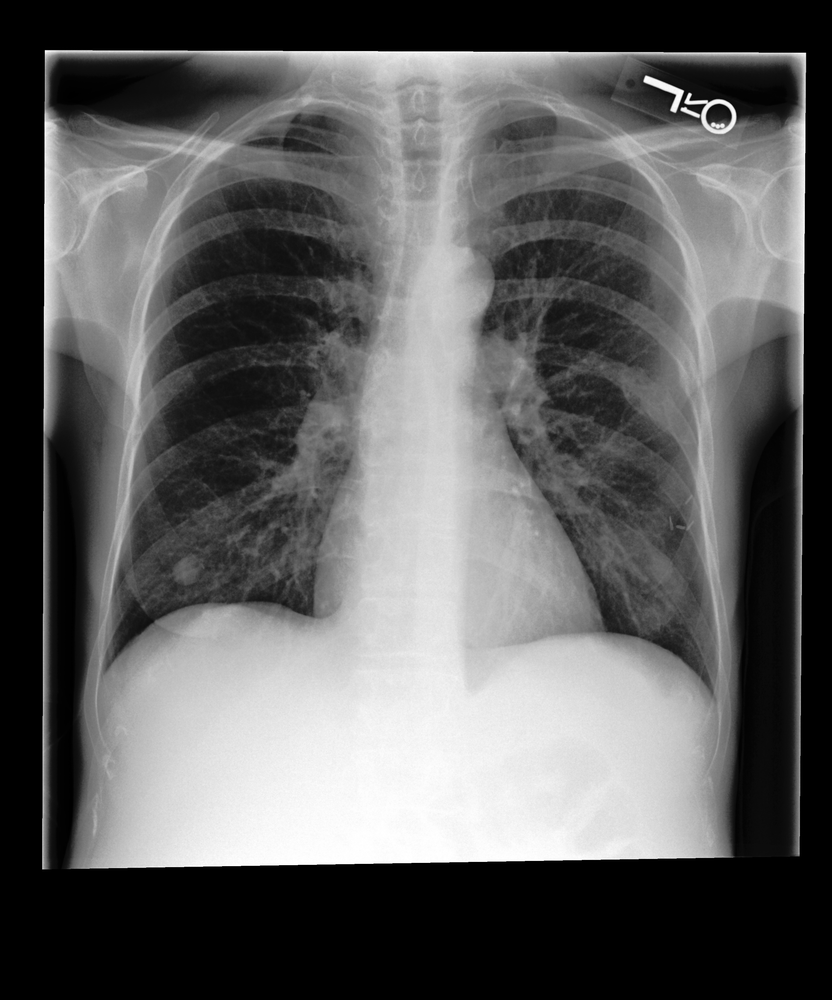

In [25]:
image = load_image(
    dir + meta['img_path'].iloc[0]
)
print(image.size)
image 

In [26]:
image.size

(2544, 3056)

In [27]:
from controlnet_aux import PidiNetDetector, HEDdetector

/data/healthy-ml/scratch/qixuanj/anaconda3/envs/control/lib/python3.8/site-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(


In [28]:
processor = HEDdetector.from_pretrained('lllyasviel/Annotators')
processor = PidiNetDetector.from_pretrained('lllyasviel/Annotators')

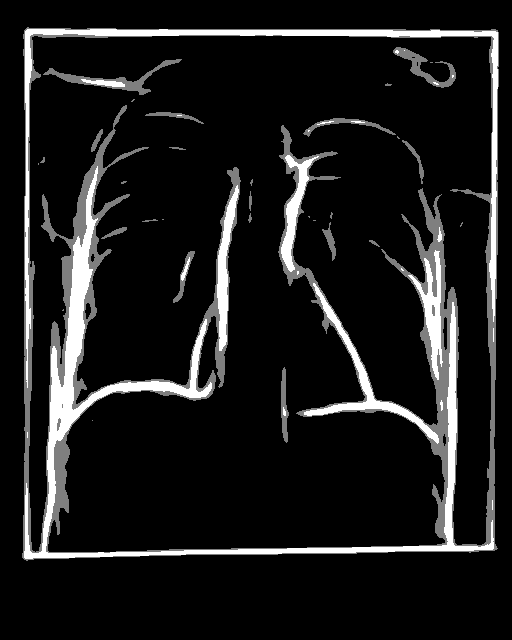

In [29]:
control_image = processor(image, safe=True)
control_image

In [30]:
control_image.size

(512, 640)

100%|█████████████████████████████████████████████████████| 20/20 [00:05<00:00,  3.72it/s]


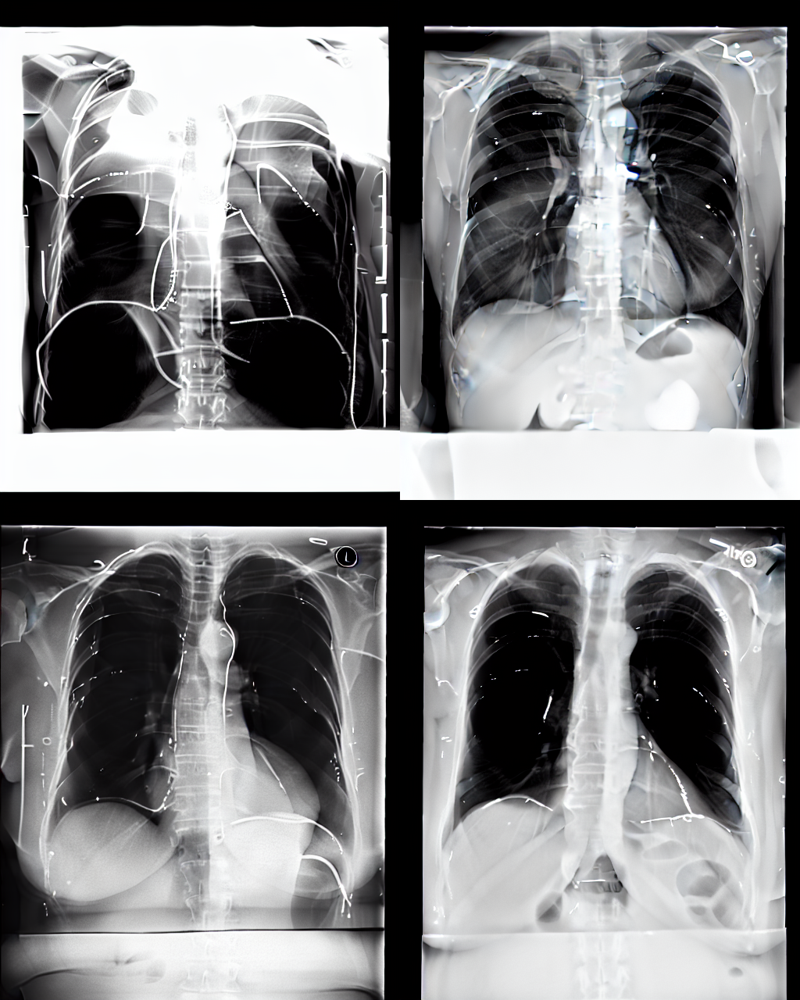

In [34]:
prompt = "chest x-ray, "
prompt = [t + prompt for t in ["no finding", "pneumonia", "enlarged cardiomediastinum", "lung opacity in upper left"]]
generator = [torch.Generator(device="cpu").manual_seed(0) for i in range(len(prompt))]

output = pipe(
    prompt,
    control_image,
    negative_prompt=["lowres, bad anatomy, worst quality, low quality, high contrast"] * len(prompt),
    generator=generator,
    num_inference_steps=20,
)

image_grid(output.images, 2, 2)

In [24]:
# Matches the control image size 
output.images[0].size

(512, 640)

# CheXmask segmentation

In [13]:
from torch.utils.data import Dataset
import json
import cv2

img_dir = "/data/healthy-ml/gobi1/data/MIMIC-CXR-JPG/files_preprocessed_1024/"
mask_dir = "/data/healthy-ml/scratch/qixuanj/generative_validation/CheXmask_Database/Masks/"

class MyDataset(Dataset):
    def __init__(self):
        with open('/data/healthy-ml/scratch/qixuanj/generative_validation/CheXmask_Database/DataPreparation/mimic_prompts.json', 'r') as f:
            self.data = json.load(f)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]

        filename = item['file_suffix']
        prompt = item['prompt']

        source = cv2.imread(f"{mask_dir}{filename}")
        target = cv2.imread(f"{img_dir}{filename}")

        # Do not forget that OpenCV read images in BGR order.
        source = cv2.cvtColor(source, cv2.COLOR_BGR2RGB)
        source = np.array(source).astype(np.float32) / 255.0

        # Normalize images to [0, 1].
        target = cv2.resize(target, (512, 512))
        target = np.array(target).astype(np.float32) / 255.0
    
        return dict(jpg=target, txt=prompt, hint=source)

In [14]:
# Own dataset file
dataset = MyDataset()

In [1]:
# dataset from huggingface 
from datasets import load_dataset

/data/healthy-ml/scratch/qixuanj/anaconda3/envs/control/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dataset = load_dataset("controlnet_chexmask")

/data/healthy-ml/scratch/qixuanj/anaconda3/envs/control/lib/python3.8/site-packages/datasets/table.py:1421: FutureWarning: promote has been superseded by mode='default'.
  table = cls._concat_blocks(blocks, axis=0)


In [16]:
# Initialize control image 
# item = dataset['validation'][20]
item = dataset[0]
jpg = item['jpg']
txt = item['txt']
hint = item['hint']

KeyError: "Invalid key: 0. Please first select a split. For example: `my_dataset_dictionary['train'][0]`. Available splits: ['train', 'validation']"

In [ ]:
print(txt)

In [17]:
plt.figure()
plt.imshow(jpg)

NameError: name 'jpg' is not defined

<Figure size 640x480 with 0 Axes>

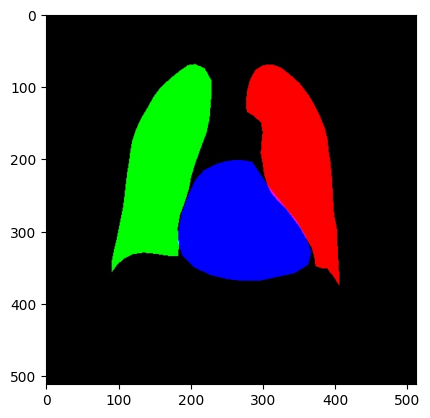

In [19]:
plt.figure()
plt.imshow(hint)

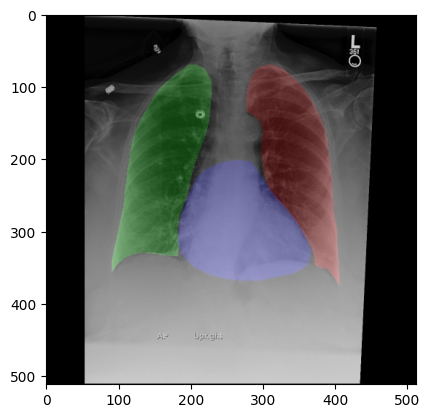

In [23]:
out = cv2.addWeighted(jpg, 0.8, hint, 0.2,0)
plt.figure()
plt.imshow(out)

In [33]:
hint_img = Image.fromarray((255 * hint).astype(np.uint8))

In [38]:
# prompt = ""
prompt = txt
prompt = [t + prompt for t in ["", "pneumonia", "enlarged cardiomediastinum", "lung opacity in upper left"]]
generator = [torch.Generator(device="cpu").manual_seed(0) for i in range(len(prompt))]

output = pipe(
    prompt,
    hint_img,
    negative_prompt=["lowres, bad anatomy, worst quality, low quality, faded"] * len(prompt),
    generator=generator,
    num_inference_steps=20,
)

100%|█████████████████████████████████████████████████████| 20/20 [00:13<00:00,  1.53it/s]


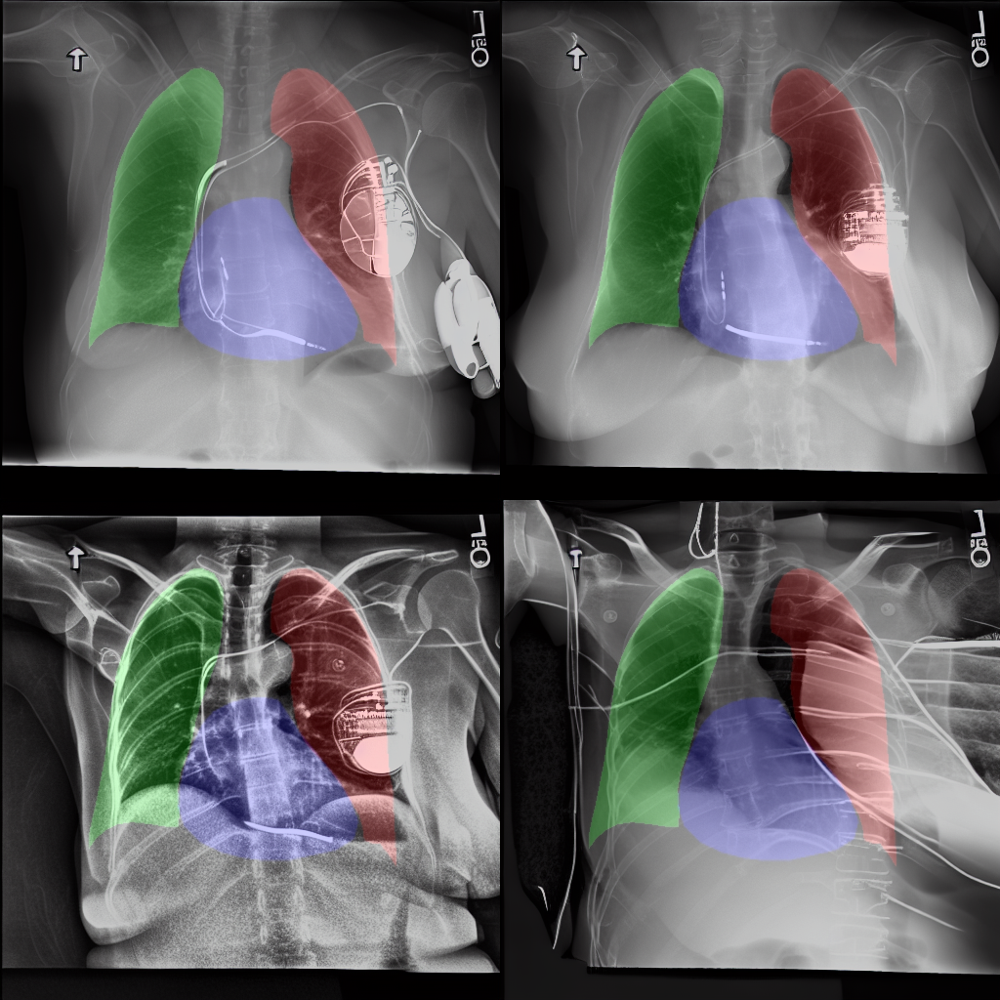

In [39]:
masked_images = [Image.fromarray(cv2.addWeighted(np.array(x), 0.8, np.array(hint_img), 0.2,0)) for x in output.images]
image_grid(masked_images, 2, 2)

In [10]:
# loop version 
save_dir = "/data/healthy-ml/scratch/qixuanj/generative_validation/results/controlnet_validation"
model_name = "roentgen_controlnet_chexmask_run3/checkpoint-37500"
save_path = f"{save_dir}/{model_name}"

controlnet = ControlNetModel.from_pretrained(f"./ckpts/{model_name}/controlnet").to(device)
pipe = StableDiffusionControlNetPipeline.from_pretrained("roentgen",
                                                    controlnet=controlnet, torch_dtype=torch.float32).to(device)
pipe.enable_model_cpu_offload()
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

Loading pipeline components...:  29%|██████▌                | 2/7 [00:03<00:08,  1.62s/it]`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
Loading pipeline components...:  57%|█████████████▏         | 4/7 [00:24<00:20,  6.82s/it]/data/healthy-ml/scratch/qixuanj/anaconda3/envs/control/lib/python3.8/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
Loading pipeline components...: 100%|███████████████████████| 7/7 [01:12<00:00, 10.34s/it]


In [11]:
from tqdm import tqdm

In [18]:
len(dataset['validation'])

16671

In [19]:
for i in range(len(dataset['validation'])): 
    if i % 5000 == 0: 
        print(i)
    item = dataset['validation'][i]
    txt = item['txt']
    hint = item['hint']
    hint_img = Image.fromarray((255 * hint).astype(np.uint8))

    prompt = txt
    # prompt = [t + prompt for t in ["", "pneumonia", "cardiomegaly", "lung opacity in upper left"]]
    prompt = [t + prompt for t in ["",]]
    generator = [torch.Generator(device="cpu").manual_seed(0) for i in range(len(prompt))]
    
    output = pipe(
        prompt,
        hint_img,
        negative_prompt=["lowres, bad anatomy, worst quality, low quality, faded"] * len(prompt),
        generator=generator,
        num_inference_steps=20,
    )
    img_id = dataset.data[i]['file_suffix'].split("/")[-1].split(".")[0]
    if not os.path.exists(f"{save_path}/{img_id}"): 
        os.makedirs(f"{save_path}/{img_id}")
    for j in range(len(output.images)):  
        output.images[j].save(f"{save_path}/{img_id}/prompt{j}.jpg")

0


TypeError: unsupported operand type(s) for *: 'int' and 'PngImageFile'

# Default Canny edge